In [1]:
from glob import glob

classic_files = glob('./data/jazz_vs_classic/Classical/*')
jazz_files = glob('./data/jazz_vs_classic/Jazz/*')

print('classic_files:', len(classic_files))
print('jazz_files:', len(jazz_files))

classic_files: 726
jazz_files: 725


In [2]:
# EDA. 채널 수와 길이를 확인

import wave

def get_wav_info(file_path):
    with wave.open(file_path, 'rb') as wav_file:
        channels = wav_file.getnchannels()  # 채널 수
        frame_rate = wav_file.getframerate()  # 샘플링 레이트
        frames = wav_file.getnframes()  # 전체 프레임 수
        duration = frames / float(frame_rate)  # 길이(초 단위)
        
    return channels, duration

# set을 사용하여 몇가지 채널 수와 길이가 있는지 확인
channels = set()
durations = set()

for file_path in classic_files + jazz_files:
    channel, duration = get_wav_info(file_path)
    channels.add(channel)
    durations.add(duration)

print('channels:', channels)
print('durations:', durations)

channels: {2}
durations: {0.0, 5.0, 0.004013605442176871, 0.002018140589569161, 0.0060090702947845805, 0.00800453514739229, 0.005011337868480726, 0.01, 0.01401360544217687, 0.012018140589569161, 0.01600907029478458, 0.015011337868480726, 0.02, 0.01800453514739229}


In [3]:
# 4초 미만의 파일은 제거

classic_files = [x for x in classic_files if get_wav_info(x)[1] >= 4]
jazz_files = [x for x in jazz_files if get_wav_info(x)[1] >= 4]

print('classic_files:', len(classic_files))
print('jazz_files:', len(jazz_files))

classic_files: 694
jazz_files: 696


In [4]:
# 재생하기

import IPython.display as ipd

idx = 10
print(f'classic_files[{idx}]:', classic_files[idx], 'duration:', get_wav_info(classic_files[idx])[1])
ipd.Audio(classic_files[idx])


classic_files[10]: ./data/jazz_vs_classic/Classical\bach-18.wav duration: 5.0


In [5]:
channels = set()
durations = set()

for file_path in classic_files + jazz_files:
    channel, duration = get_wav_info(file_path)
    channels.add(channel)
    durations.add(duration)

print('channels:', channels)
print('durations:', durations)

channels: {2}
durations: {5.0}


In [6]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# librosa 라이브러리를 사용하여 MFCC를 추출하는 함수 
def to_mfcc(file_path):
    y, sr = librosa.load(file_path, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    return mfcc, sr

# mfcc를 matplotlib을 사용하여 시각화하는 함수
def show_mfcc(mfcc, sr):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mfcc, x_axis='time', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title('MFCC')
    plt.tight_layout()
    plt.show()


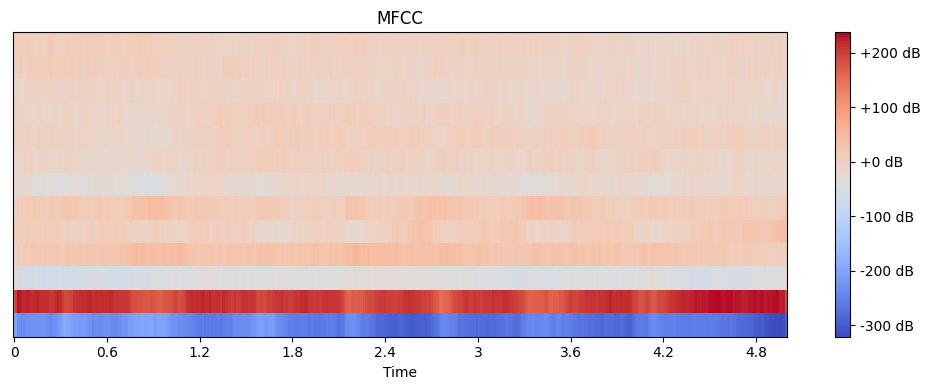

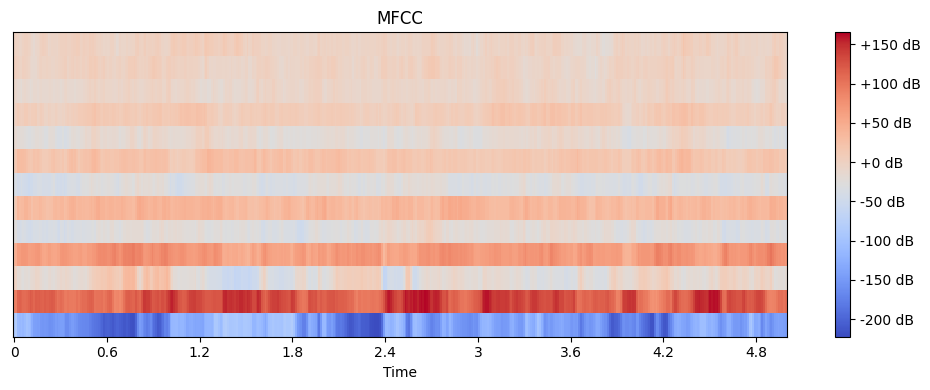

((13, 431), (13, 431))

In [7]:
class_mfcc0, src0 = to_mfcc(classic_files[0])
jazz_mfcc0, scj0 = to_mfcc(jazz_files[0])

show_mfcc(class_mfcc0, src0)
show_mfcc(jazz_mfcc0, scj0)

class_mfcc0.shape, jazz_mfcc0.shape

In [8]:
# 파일을 셔플링하여 데이터를 나누는 함수

from sklearn.model_selection import train_test_split

def train_valid_test_split(train_percent: int, valid_percent: int, test_percent: int, classic_files, jazz_files):
    total = train_percent + valid_percent + test_percent

    train_cnt = int(len(jazz_files) * train_percent / total)
    valid_cnt = int(len(jazz_files) * valid_percent / total)
    # test_cnt = int(len(classic_files) * test_percent / total)
    
    classic_files = np.random.permutation(classic_files)
    jazz_files = np.random.permutation(jazz_files)
    
    classic_train, classic_valid_test = train_test_split(classic_files, train_size=train_cnt, shuffle=False)
    classic_valid, classic_test = train_test_split(classic_valid_test, train_size=valid_cnt, shuffle=False)
    
    jazz_train, jazz_valid_test = train_test_split(jazz_files, train_size=train_cnt, shuffle=False)
    jazz_valid, jazz_test = train_test_split(jazz_valid_test, train_size=valid_cnt, shuffle=False)
    
    return classic_train, classic_valid, classic_test, jazz_train, jazz_valid, jazz_test

classic_train, classic_valid, classic_test, jazz_train, jazz_valid, jazz_test = train_valid_test_split(60, 20, 20, classic_files, jazz_files)

print('classic_train:', len(classic_train))
print('classic_valid:', len(classic_valid))
print('classic_test:', len(classic_test))

print('jazz_train:', len(jazz_train))
print('jazz_valid:', len(jazz_valid))
print('jazz_test:', len(jazz_test))

type(classic_train)

train_files = classic_train.tolist() + jazz_train.tolist()
valid_files = classic_valid.tolist() + jazz_valid.tolist()
test_files = classic_test.tolist()[:min(len(jazz_test), len(classic_test))] + jazz_test.tolist()[:min(len(jazz_test), len(classic_test))]

print('train_files:', len(train_files))
print('valid_files:', len(valid_files))
print('test_files:', len(test_files))


classic_train: 417
classic_valid: 139
classic_test: 138
jazz_train: 417
jazz_valid: 139
jazz_test: 140
train_files: 834
valid_files: 278
test_files: 276


In [9]:
# permutation 
train_files = np.random.permutation(train_files)
valid_files = np.random.permutation(valid_files)
test_files = np.random.permutation(test_files)

for i in range(10):
    print(train_files[i])

./data/jazz_vs_classic/Jazz\mclean_j-8.wav
./data/jazz_vs_classic/Jazz\world_saxaphone_quartet-12.wav
./data/jazz_vs_classic/Classical\brahms-15.wav
./data/jazz_vs_classic/Jazz\hubbard-13.wav
./data/jazz_vs_classic/Classical\mahler_g-14.wav
./data/jazz_vs_classic/Classical\liszt-16.wav
./data/jazz_vs_classic/Jazz\hubbard-16.wav
./data/jazz_vs_classic/Jazz\shepp_a-1.wav
./data/jazz_vs_classic/Jazz\brubeck_d-21.wav
./data/jazz_vs_classic/Classical\copland_a-1.wav


In [10]:
# file path에 jazz가 포함되어 있으면 1 아니면 0을 반환해서 train_target, valid_target, test_target을 생성하는 함수

def to_target(files):
    return np.array([1 if 'Jazz' in file else 0 for file in files])

train_target = to_target(train_files)
valid_target = to_target(valid_files)
test_target = to_target(test_files)

print('train_target:', train_target)
print('valid_target:', valid_target)


train_target: [1 1 0 1 0 0 1 1 1 0 0 0 1 0 0 0 0 1 1 0 0 1 0 0 0 1 1 1 0 1 1 1 0 0 1 1 1
 1 1 0 0 0 1 0 0 0 0 0 0 1 1 1 0 0 1 0 1 0 1 0 1 1 0 0 1 1 0 0 0 0 1 1 1 1
 1 0 0 1 1 1 0 1 0 1 1 1 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 1 0
 1 0 0 0 0 0 1 1 0 1 1 1 0 0 0 1 0 0 0 1 0 0 1 1 0 1 0 0 0 0 1 1 1 1 0 0 0
 1 1 1 1 1 1 0 1 1 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 0 0 1 0 1 1 1 0 1 1 1 0 1
 1 1 0 1 1 1 0 1 1 0 0 0 0 1 0 0 1 0 0 1 1 1 1 1 0 1 0 0 0 0 1 1 1 1 0 1 1
 0 0 0 0 0 0 1 1 1 1 1 0 0 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 0 1 1 0 1 1 1 1 0 0 0 0 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 0
 0 0 1 0 0 1 1 0 1 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 1 1 0 0 1 1 1 1 0 0 1 1
 1 0 1 0 1 1 0 1 0 1 1 0 0 1 1 0 1 1 0 0 0 1 1 0 0 1 1 0 1 0 1 0 1 1 1 1 1
 1 1 0 1 0 1 0 1 0 1 0 0 0 1 1 0 0 0 0 1 0 1 0 0 1 1 1 1 1 1 0 1 1 1 1 0 1
 0 0 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 0 0 1 1 0 1 1 0 1 1 1 0 1 0 1 1 1 0 1
 1 1 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 1 0 0 1 0 1 0 1 0 0 1 0 1 0 1 0 0 1
 1 0 0 1 0 

In [11]:


# 샘플로 재생해서 들어보기
import IPython.display as ipd

idx = 103
print('train_files:', train_files[idx], 'target:', train_target[idx])
ipd.Audio(train_files[idx])



train_files: ./data/jazz_vs_classic/Classical\handel-19.wav target: 0


In [12]:
# mfcc 만들기
from tqdm import tqdm

train_mfccs = []

for file in tqdm(train_files):
    mfcc, _ = to_mfcc(file)
    train_mfccs.append(mfcc)

valid_mfccs = []

for file in tqdm(valid_files):
    mfcc, _ = to_mfcc(file)
    valid_mfccs.append(mfcc)

test_mfccs = []

for file in tqdm(test_files):
    mfcc, _ = to_mfcc(file)
    test_mfccs.append(mfcc)


100%|██████████| 276/276 [00:02<00:00, 100.95it/s]


In [13]:
from tensorflow import keras
from tensorflow.keras import layers

# 모델 생성
inputs = keras.Input(shape=(train_mfccs[0].shape[0], train_mfccs[0].shape[1]))
x = layers.Flatten()(inputs)

x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
# x = layers.Dense(128, activation='relu')(x)
# x = layers.Dropout(0.5)(x)
# x = layers.Dense(64, activation='relu')(x)
# x = layers.Dropout(0.5)(x)

outputs = layers.Dense(1, activation='sigmoid')(x)
model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 13, 431)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 5603)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     1,434,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,434,881 (5.47 MB)

 Trainable params: 1,434,881 (5.47 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
callbacks = [
    keras.callbacks.ModelCheckpoint('best_jazz_classic_model.keras', save_best_only=True, monitor='val_loss'),
]

history = model.fit(
    np.array(train_mfccs), train_target,
    validation_data=(np.array(valid_mfccs), valid_target),
    epochs=250,
    batch_size=32,
    callbacks=callbacks
)

Epoch 1/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5791 - loss: 428.0161 - val_accuracy: 0.7590 - val_loss: 39.3284
Epoch 2/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7223 - loss: 38.2181 - val_accuracy: 0.7914 - val_loss: 1.9464
Epoch 3/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6604 - loss: 6.4049 - val_accuracy: 0.8273 - val_loss: 0.7347
Epoch 4/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6918 - loss: 3.1543 - val_accuracy: 0.6655 - val_loss: 5.3553
Epoch 5/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6851 - loss: 5.2182 - val_accuracy: 0.7842 - val_loss: 0.5975
Epoch 6/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7218 - loss: 1.3452 - val_accuracy: 0.8273 - val_loss: 0.5470
Epoch 7/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7029 - loss: 1.2568 - val_accuracy: 0.7914 - val_loss: 0.5108
Epoch 8/250
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7155 - loss: 0.9671 - val_accuracy: 0.7302

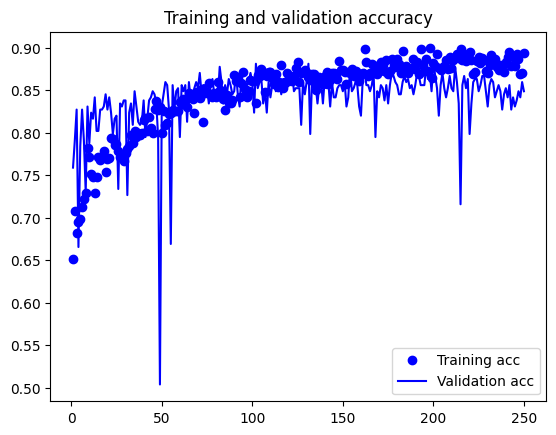

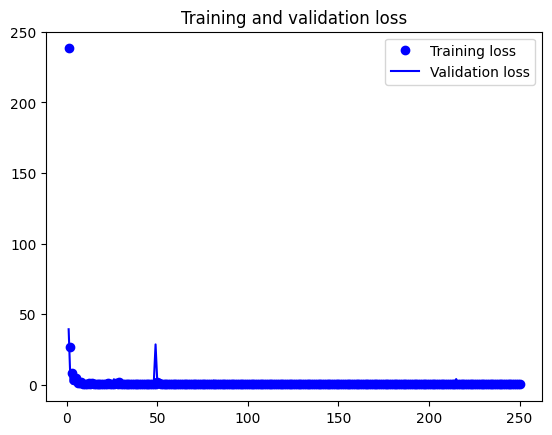

In [15]:
import matplotlib.pyplot as plt

accuarcy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuarcy) + 1)
plt.plot(epochs, accuarcy, 'bo', label='Training acc')
plt.plot(epochs, val_accuracy, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [16]:
# test 데이터로 평가

model = keras.models.load_model('best_jazz_classic_model.keras')
test_loss, test_acc = model.evaluate(np.array(test_mfccs), test_target)

print('Test accuracy:', test_acc)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8236 - loss: 0.4486 
Test accuracy: 0.8333333134651184


## 잘 맞추는지 테스트 해보자. 
- score가 0에 가까우면 클래식, 1에 가까우면 재즈다. 

In [24]:
# 10 개 샘플로 예측

predictions = model.predict(np.array(test_mfccs[:10]))

for i in range(5):
    print('Predict:', 'classic' if predictions[i] < 0.5 else 'jazz')
    print('Real   :', 'classic' if test_target[i] < 0.5 else 'jazz')
    print('score  :', predictions[i])
    print(test_files[i])
    # 재생
    ipd.display(ipd.Audio(test_files[i]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Predict: classic
Real   : classic
score  : [0.09175203]
./data/jazz_vs_classic/Classical\tchaikovsky-16.wav


Predict: jazz
Real   : jazz
score  : [0.99999964]
./data/jazz_vs_classic/Jazz\washington_d-11.wav


Predict: classic
Real   : classic
score  : [0.03442051]
./data/jazz_vs_classic/Classical\copland_a-18.wav


Predict: jazz
Real   : classic
score  : [0.99999154]
./data/jazz_vs_classic/Classical\stravinasky-16.wav


Predict: classic
Real   : jazz
score  : [0.42362154]
./data/jazz_vs_classic/Jazz\marsalis_w-10.wav


# Conv2D 사용해보자. 

In [18]:
# Conv2D를 사용하여 모델을 다시 만들기

inputs = keras.Input(shape=(train_mfccs[0].shape[0], train_mfccs[0].shape[1], 1))
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)
# x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
# x = layers.MaxPooling2D((2, 2))(x)
x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation='sigmoid')(x)
model_conv2d = keras.Model(inputs=inputs, outputs=outputs)
model_conv2d.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model_conv2d.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 13, 431, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 13, 431, 32)    │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 6, 215, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 6, 215, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 3, 107, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 3, 107, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 1, 53, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6784)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     3,473,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,567,105 (13.61 MB)

 Trainable params: 3,567,105 (13.61 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
callbacks = [
    keras.callbacks.ModelCheckpoint('best_jazz_classic_model_conv2d.keras', save_best_only=True, monitor='val_loss'),
    keras.callbacks.EarlyStopping(monitor='val_loss', patience=40)

]


history = model_conv2d.fit(
    np.array(train_mfccs).reshape(-1, train_mfccs[0].shape[0], train_mfccs[0].shape[1], 1), train_target,
    validation_data=(np.array(valid_mfccs).reshape(-1, valid_mfccs[0].shape[0], valid_mfccs[0].shape[1], 1), valid_target),
    epochs=150,
    batch_size=32,
    callbacks=callbacks
)

Epoch 1/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.5771 - loss: 113.7482 - val_accuracy: 0.5072 - val_loss: 2.5705
Epoch 2/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.6845 - loss: 1.4766 - val_accuracy: 0.5000 - val_loss: 11.5089
Epoch 3/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.6001 - loss: 2.2212 - val_accuracy: 0.5000 - val_loss: 1.2589
Epoch 4/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.5802 - loss: 1.8265 - val_accuracy: 0.8129 - val_loss: 0.3877
Epoch 5/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7486 - loss: 0.6213 - val_accuracy: 0.8345 - val_loss: 0.7066
Epoch 6/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.6722 - loss: 1.0035 - val_accuracy: 0.5000 - val_loss: 2.5211
Epoch 7/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.6495 - loss: 1.6663 - val_accuracy: 0.7878 - val_loss: 0.9122
Epoch 8/150
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7797 - loss: 0.5526 - val_accuracy:

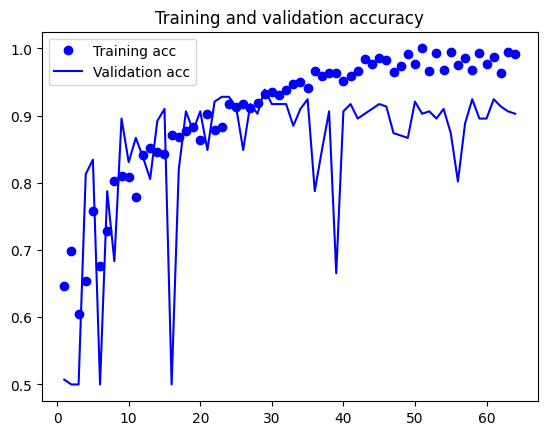

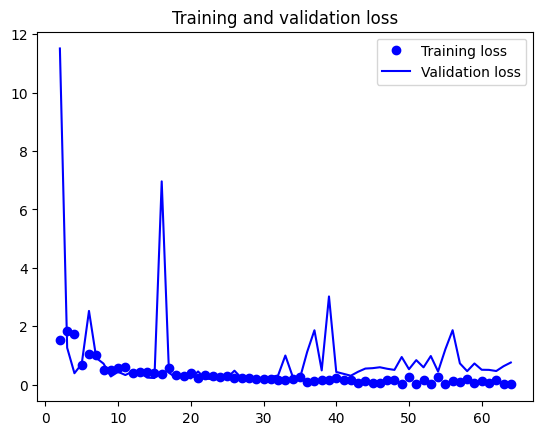

In [20]:
# 결과 시각화

accuarcy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuarcy) + 1)
plt.plot(epochs, accuarcy, 'bo', label='Training acc')
plt.plot(epochs, val_accuracy, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs[1:], loss[1:], 'bo', label='Training loss')
plt.plot(epochs[1:], val_loss[1:], 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [21]:
# test 데이터로 평가

model_conv2d = keras.models.load_model('best_jazz_classic_model_conv2d.keras')
test_loss, test_acc = model_conv2d.evaluate(np.array(test_mfccs).reshape(-1, test_mfccs[0].shape[0], test_mfccs[0].shape[1], 1), test_target)

print('Test accuracy:', test_acc)
print('Test loss:', test_loss)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9161 - loss: 0.3083
Test accuracy: 0.9021739363670349
Test loss: 0.3051481544971466


In [23]:
# 20 개 샘플로 예측

predictions = model_conv2d.predict(np.array(test_mfccs[:20]).reshape(-1, test_mfccs[0].shape[0], test_mfccs[0].shape[1], 1))

for i in range(5):
    print('Predict:', 'classic' if predictions[i] < 0.5 else 'jazz')
    print('Real   :', 'classic' if test_target[i] < 0.5 else 'jazz')
    print('score  :', predictions[i])
    print(test_files[i])
    # 재생
    ipd.display(ipd.Audio(test_files[i]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Predict: classic
Real   : classic
score  : [0.04593281]
./data/jazz_vs_classic/Classical\tchaikovsky-16.wav


Predict: jazz
Real   : jazz
score  : [0.9999969]
./data/jazz_vs_classic/Jazz\washington_d-11.wav


Predict: classic
Real   : classic
score  : [0.00099545]
./data/jazz_vs_classic/Classical\copland_a-18.wav


Predict: jazz
Real   : classic
score  : [0.9997708]
./data/jazz_vs_classic/Classical\stravinasky-16.wav


Predict: jazz
Real   : jazz
score  : [0.6711072]
./data/jazz_vs_classic/Jazz\marsalis_w-10.wav
